In [1]:
import sys
import os
sys.path.insert(0, os.path.abspath("../"))


In [2]:
import argparse
import time
from pathlib import Path

import cv2
import torch
import torchvision
from torchvision import transforms
import yaml
import numpy as np

from tqdm.auto import tqdm
import matplotlib.pyplot as plt
import plotly.express as px
import uuid
from IPython.display import HTML
from base64 import b64encode
import subprocess

from detectron2.modeling.poolers import ROIPooler
from detectron2.structures import Boxes
from detectron2.utils.memory import retry_if_cuda_oom
from detectron2.layers import paste_masks_in_image

from utils.datasets import letterbox
from utils.general import non_max_suppression_mask_conf, increment_path


In [3]:
# arguments
ARGS = {
    'weights': '../libs/yolov7-mask/yolov7-mask.pt',
    'img-size': 640,
    'conf-thres': 0.5,
    'iou-thres': 0.45,
    'hyp': '../libs/yolov7-mask/data/hyp.scratch.mask.yaml',
    'seed': 1,
    'thickness': 1,
    'no-bbox': True,
    'no-label': True,
    'show-fps': True,
}


In [4]:
# model initialization
np.random.seed(ARGS['seed'])
DEVICE = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

HALF_CAPABLE = DEVICE.type != "cpu"

print(DEVICE.type)

weights = torch.load(ARGS['weights'])
model = weights['model'].to(DEVICE)

CLASSES = model.names
print(CLASSES)

if HALF_CAPABLE:
    model = model.half()
else:
    model = model.float()

model.eval()

with open(ARGS['hyp']) as f:
    HYPERPARAMETERS = yaml.load(f, Loader=yaml.FullLoader)

pooler = ROIPooler(
    output_size=HYPERPARAMETERS['mask_resolution'],
    scales=(model.pooler_scale,),
    sampling_ratio=1,
    pooler_type='ROIAlignV2',
    canonical_level=2)


cuda


/home/nicholassv/anaconda3/envs/thesis_linux_3.9/lib/python3.9/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


['person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus', 'train', 'truck', 'boat', 'traffic light', 'fire hydrant', 'stop sign', 'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse', 'sheep', 'cow', 'elephant', 'bear', 'zebra', 'giraffe', 'backpack', 'umbrella', 'handbag', 'tie', 'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball', 'kite', 'baseball bat', 'baseball glove', 'skateboard', 'surfboard', 'tennis racket', 'bottle', 'wine glass', 'cup', 'fork', 'knife', 'spoon', 'bowl', 'banana', 'apple', 'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza', 'donut', 'cake', 'chair', 'couch', 'potted plant', 'bed', 'dining table', 'toilet', 'tv', 'laptop', 'mouse', 'remote', 'keyboard', 'cell phone', 'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'book', 'clock', 'vase', 'scissors', 'teddy bear', 'hair drier', 'toothbrush']


In [5]:
# !wget -O people.jpg https://dunhamweb.com/wp-content/uploads/good-shepherd-centres.jpg


In [6]:
# image test

from time import perf_counter_ns

start_time = perf_counter_ns()

img = cv2.imread("./people.jpg")
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img_shape = img.shape
ltbx_img = letterbox(img, 640, stride=32)[0]

# px.imshow(ltbx_img).show()
# print(img.shape)
# print(ltbx_img.shape)

tensorimg = transforms.ToTensor()(ltbx_img)
tensorimg = torch.tensor(np.array([tensorimg.numpy()]))
tensorimg = tensorimg.to(DEVICE)
tensorimg = tensorimg.half() if HALF_CAPABLE else tensorimg.float()

with torch.no_grad():
    out = model(tensorimg)

inf_out, attn, bases, sem_output = out['test'], out['attn'], out['bases'], out['sem']

bases = torch.cat([bases, sem_output], dim=1)

_, _, h, w = tensorimg.shape

names = model.names

out, out_mask, _, _, _ = non_max_suppression_mask_conf(
    inf_out,
    attn,
    bases,
    pooler,
    HYPERPARAMETERS,
    conf_thres=ARGS['conf-thres'],
    iou_thres=ARGS['iou-thres'],
    merge=False,
    mask_iou=None)

pred, pred_masks = out[0], out_mask[0]

base = bases[0]

if pred is not None:
    bboxes = Boxes(pred[:, :4])
    ori_pred_masks = pred_masks.view(-1, HYPERPARAMETERS['mask_resolution'], HYPERPARAMETERS['mask_resolution'])
    pred_masks = retry_if_cuda_oom(paste_masks_in_image)(ori_pred_masks, bboxes, (h, w), threshold=0.5)

    pred_masks_np = pred_masks.detach().cpu().numpy()
    pred_cls = pred[:, 5].detach().cpu().numpy()
    pred_conf = pred[:, 4].detach().cpu().numpy()
    nbboxes = bboxes.tensor.detach().cpu().numpy().astype(int)

    tensorimg_disp = tensorimg[0].permute(1, 2, 0)*255
    img_disp = tensorimg_disp.cpu().numpy().astype(np.uint8)

    img_disp = cv2.cvtColor(img_disp, cv2.COLOR_RGB2BGR)

    for mask, bbox, cls, conf in zip(pred_masks_np, nbboxes, pred_cls, pred_conf):

        color = [np.random.randint(255), np.random.randint(255), np.random.randint(255)]

        # print(mask.shape)

        img_disp[mask] = img_disp[mask] * 0.5 + np.array(color, dtype=np.uint8) * 0.5

        label = '%s %.3f' % (names[int(cls)], conf)

        tf = max(ARGS['thickness'] - 1, 1)
        t_size = cv2.getTextSize(label, 0, fontScale=ARGS['thickness']/3, thickness=tf)[0]
        c2 = bbox[0] + t_size[0], bbox[1] - t_size[1] - 3

        if not ARGS['no-bbox']:
            cv2.rectangle(img_disp, (bbox[0], bbox[1]), (bbox[2], bbox[3]), color, thickness=ARGS['thickness'], lineType=cv2.LINE_AA)

        if not ARGS['no-label']:
            cv2.rectangle(img_disp, (bbox[0], bbox[1]), c2, color, thickness=-1, lineType=cv2.LINE_AA)
            cv2.putText(img_disp, label, (bbox[0], bbox[1] - 2), 0, ARGS['thickness']/3, [255, 255, 255], thickness=tf, lineType=cv2.LINE_AA)

tot_time = (perf_counter_ns()-start_time)*0.000001
img_disp = cv2.resize(img_disp, (img_shape[1], img_shape[0]))

print(1000/tot_time)


0.5646696614381426


/home/nicholassv/anaconda3/envs/thesis_linux_3.9/lib/python3.9/site-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3190.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


In [154]:
import time
import torchvision
from torch.nn import functional as F
import numpy
import detectron2
import torch.multiprocessing as mp

# optimizing conversions with torch jit and removing unused variables

@torch.jit.script
def rev_xywh2xyxy(x: torch.Tensor) -> torch.Tensor:
    # Convert nx4 boxes from [x, y, w, h] to [x1, y1, x2, y2] where xy1=top-left, xy2=bottom-right
    y: torch.Tensor = x.clone()
    y[:, 0] = x[:, 0] - x[:, 2] / 2  # top left x
    y[:, 1] = x[:, 1] - x[:, 3] / 2  # top left y
    y[:, 2] = x[:, 0] + x[:, 2] / 2  # bottom right x
    y[:, 3] = x[:, 1] + x[:, 3] / 2  # bottom right y
    return y


@torch.jit.script
def rev_merge_bases(rois: torch.Tensor, coeffs: torch.Tensor, attn_r: int, num_b: int) -> torch.Tensor:
    # merge predictions
    N, _, H, W = rois.size()
    if coeffs.dim() != 4:
        coeffs = coeffs.view(N, num_b, attn_r, attn_r)
    coeffs: torch.Tensor = F.interpolate(coeffs, (H, W),
                                         mode="bilinear").softmax(dim=1)
    masks_preds: torch.Tensor = (rois * coeffs).sum(dim=1)
    return masks_preds


# Boxes = torch.jit.script(Boxes)
pooler = torch.jit.script(pooler)

@torch.jit.script
def rev_loopable_non_max_suppression_mask_conf(
    x: torch.Tensor,
    xc : torch.Tensor,
    xi: int,
    attn: torch.Tensor, 
    bases: torch.Tensor, 
    attn_res: int, 
    num_base: int, 
    pooler: ROIPooler, 
    conf_thres: float, 
    iou_thres: float ,
    multi_label: bool,
    max_wh: int,
    max_det: int
) -> tuple[bool, torch.Tensor, torch.Tensor]:
    output: torch.Tensor = torch.empty((0))
    output_mask: torch.Tensor = torch.empty((0))

    # Apply constraints
    # x[((x[..., 2:4] < min_wh) | (x[..., 2:4] > max_wh)).any(1), 4] = 0  # width-height

    x = x[xc[xi]]  # confidence

    # If none remain process next image
    if not x.shape[0]:
        return False, output, output_mask

    # Box (center x, center y, width, height) to (x1, y1, x2, y2)
    box = rev_xywh2xyxy(x[:, :4])

    a = attn[xi][xc[xi]]
    base = bases[xi]

    bboxes = Boxes(box)

    base_li: list[torch.Tensor] = [base[None]]
    bbox_li: list[Boxes] = [bboxes]
    pooled_bases: torch.Tensor = pooler.forward(base_li, bbox_li)

    pred_masks = rev_merge_bases(pooled_bases, a, attn_res, num_base).view(a.shape[0], -1).sigmoid()

    temp = pred_masks.clone()
    temp[temp < 0.5] = 1 - temp[temp < 0.5]
    log_score: torch.Tensor = torch.log(temp)
    mean_score: torch.Tensor = log_score.mean(-1, True)
    mask_score: torch.Tensor = torch.exp(mean_score)  # torch.mean(temp, dim=-1, keepdims=True)

    x[:, 5:] *= x[:, 4:5] * mask_score  # x[:, 4:5] *   * mask_conf * non_mask_conf  # conf = obj_conf * cls_conf

    if multi_label:
        conf_label: torch.Tensor = x[:, 5:] > conf_thres
        conf_label: torch.Tensor = conf_label.nonzero()
        conf_label: torch.Tensor = conf_label.T
        i, j = conf_label[0], conf_label[1]
        x = torch.cat((box[i], x[i, j + 5, None], j[:, None].float()), 1)
        mask_score = mask_score[i]
        if attn is not None:
            pred_masks = pred_masks[i]
    else:  # best class only
        conf, j = x[:, 5:].max(1, keepdim=True)
        x = torch.cat((box, conf, j.float()), 1)[conf.view(-1) > conf_thres]

    filter: torch.Tensor = x[:, 5:6] == 0
    filter = filter.any(1)
    x = x[filter]

    # If none remain process next image
    n = x.shape[0]  # number of boxes
    if not n:
        return False, output, output_mask

    # Batched NMS
    c = x[:, 5:6] * max_wh  # classes
    boxes, scores = x[:, :4] + c, x[:, 4]  # boxes (offset by class), scores
    # scores *= mask_score
    i = torchvision.ops.boxes.nms(boxes, scores, iou_thres)
    if i.shape[0] > max_det:  # limit detections
        i = i[:max_det]

    output: torch.Tensor = x[i]
    if attn is not None:
        output_mask: torch.Tensor = pred_masks[i]

    return True, output, output_mask

@torch.jit.script
def rev_non_max_suppression_mask_conf(prediction: torch.Tensor, attn: torch.Tensor, bases: torch.Tensor, attn_res: int, num_base: int, pooler: ROIPooler, conf_thres: float = 0.1, iou_thres: float = 0.6):

    nc = prediction[0].shape[1] - 5  # number of classes
    xc = prediction[..., 4] > conf_thres  # candidates
    # Settings
    max_wh = 4096  # (pixels) minimum and maximum box width and height
    max_det = 300  # maximum number of detections per image
    multi_label = nc > 1  # multiple labels per box (adds 0.5ms/img)

    output = []
    output_mask = []

    futures: list[torch.jit.Future[tuple[bool, torch.Tensor, torch.Tensor]]] = []
    for xi in range(len(prediction)):  # image index, image inference
        futures.append(torch.jit.fork(rev_loopable_non_max_suppression_mask_conf,
                        prediction[xi],
                        xc,
                        xi,
                        attn, 
                        bases, 
                        attn_res, 
                        num_base, 
                        pooler, 
                        conf_thres, 
                        iou_thres,
                        multi_label,
                        max_wh,
                        max_det))
        
    for future in futures:
        succ, output_s, output_mask_s = torch.jit.wait(future)
        if succ:
            output.append(output_s)
            output_mask.append(output_mask_s)

    return output, output_mask


In [103]:
def old_rev_non_max_suppression_mask_conf(prediction: torch.Tensor, attn: torch.Tensor, bases: torch.Tensor, attn_res: int, num_base: int, pooler: ROIPooler, conf_thres: float = 0.1, iou_thres: float = 0.6):

    nc = prediction[0].shape[1] - 5  # number of classes
    xc = prediction[..., 4] > conf_thres  # candidates
    # Settings
    max_wh = 4096  # (pixels) minimum and maximum box width and height
    max_det = 300  # maximum number of detections per image
    multi_label = nc > 1  # multiple labels per box (adds 0.5ms/img)

    output: list[torch.Tensor] = [torch.empty((0))] * prediction.shape[0]
    output_mask: list[torch.Tensor] = [torch.empty((0))] * prediction.shape[0]

    for xi, x in enumerate(prediction):  # image index, image inference
        x = x[xc[xi]]  # confidence

        # If none remain process next image
        if not x.shape[0]:
            continue

        # Box (center x, center y, width, height) to (x1, y1, x2, y2)
        box: torch.Tensor = rev_xywh2xyxy(x[:, :4])
        a: torch.Tensor = attn[xi][xc[xi]]
        base: torch.Tensor = bases[xi]
        bboxes: Boxes = Boxes(box)
        base_li: list[torch.Tensor] = [base[None]]
        bbox_li: list[Boxes] = [bboxes]
        pooled_bases: torch.Tensor = pooler.forward(base_li, bbox_li)

        pred_masks: torch.Tensor = rev_merge_bases(pooled_bases, a, attn_res, num_base).view(a.shape[0], -1).sigmoid()

        temp: torch.Tensor = pred_masks.clone()
        temp[temp < 0.5] = 1 - temp[temp < 0.5]
        log_score: torch.Tensor = torch.log(temp)
        mean_score: torch.Tensor = log_score.mean(-1, True)
        mask_score: torch.Tensor = torch.exp(mean_score)  # torch.mean(temp, dim=-1, keepdims=True)

        x[:, 5:] *= x[:, 4:5] * mask_score  # x[:, 4:5] *   * mask_conf * non_mask_conf  # conf = obj_conf * cls_conf

        if multi_label:
            conf_label: torch.Tensor = x[:, 5:] > conf_thres
            conf_label = conf_label.nonzero()
            conf_label = conf_label.T
            i, j = conf_label[0], conf_label[1]
            x = torch.cat((box[i], x[i, j + 5, None], j[:, None].float()), 1)
            mask_score = mask_score[i]
            if attn is not None:
                pred_masks = pred_masks[i]
        else:  # best class only
            conf_label = x[:, 5:]
            conf_label = conf_label
            conf, j = x[:, 5:].max(1, keepdim=True)
            x = torch.cat((box, conf, j.float()), 1)[conf.view(-1) > conf_thres]

        filter: torch.Tensor = x[:, 5:6] == 0
        filter = filter.any(1)
        x = x[filter]

        # If none remain process next image
        n = x.shape[0]  # number of boxes
        if not n:
            continue

        # Batched NMS
        c = x[:, 5:6] * max_wh  # classes
        boxes, scores = x[:, :4] + c, x[:, 4]  # boxes (offset by class), scores
        # scores *= mask_score
        i = torchvision.ops.boxes.nms(boxes, scores, iou_thres)
        if i.shape[0] > max_det:  # limit detections
            i = i[:max_det]

        output[xi] = x[i]
        if attn is not None:
            output_mask[xi] = pred_masks[i]

    return output, output_mask

In [9]:
img = cv2.imread("./people.jpg")
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)


In [10]:
import numba

# rewrote letterbox algorithm to remove unused returns such as ratio and dwdh 
# and useless args such as scaleup, auto, and scalefill (we dont want stretch images)
# and seperation for non cv2 action and use jit with numba

@numba.njit(fastmath=True)
def pre_rev_letterbox(
    shape: tuple[int, int],
    new_shape: int,
    stride: int
) -> tuple[tuple[int,int], tuple[int,int,int,int]]:
    # Scale ratio (new / old)
    r = max(shape)
    r = new_shape / r

    # Compute padding
    new_unpad = int(round(shape[1] * r)), int(round(shape[0] * r))
    dw, dh = new_shape - new_unpad[0], new_shape - new_unpad[1]  # wh padding
    dw, dh = dw % stride, dh % stride  # wh padding
    dw /= 2  # divide padding into 2 sides
    dh /= 2

    top, bottom = int(round(dh - 0.1)), int(round(dh + 0.1))
    left, right = int(round(dw - 0.1)), int(round(dw + 0.1))

    return new_unpad, (top, bottom, left, right)

def rev_letterbox(img, new_shape = 640, color=(114, 114, 114), stride=32):
    # Resize and pad image while meeting stride-multiple constraints
    shape = img.shape[:2]  # current shape [height, width]

    new_unpad, (top, bottom, left, right) = pre_rev_letterbox(
       shape, new_shape, stride
    )

    if shape[::-1] != new_unpad:  # resize
        img = cv2.resize(img, new_unpad, interpolation=cv2.INTER_LINEAR)
    img = cv2.copyMakeBorder(img, top, bottom, left, right, cv2.BORDER_CONSTANT, value=color)  # add border
    return img

In [11]:
prepare_test = [img]*1000

In [211]:
avg_norm = []
avg_rev = []

for a in range(100):
    for i in prepare_test:
        start_time_norm = perf_counter_ns()
        ltbx_img = letterbox(i, 1280, stride=32)[0]
        tot_time_norm = (perf_counter_ns()-start_time_norm)
        avg_norm.append(1000/(tot_time_norm*0.000001))

        start_time_rev = perf_counter_ns()
        ltbx_img = rev_letterbox(i, 1280, stride=32)
        tot_time_rev = (perf_counter_ns()-start_time_rev)
        avg_rev.append(1000/(tot_time_rev*0.000001))

print(np.average(avg_norm))
print(np.average(avg_rev))

922.4430306165877
926.8191846645472



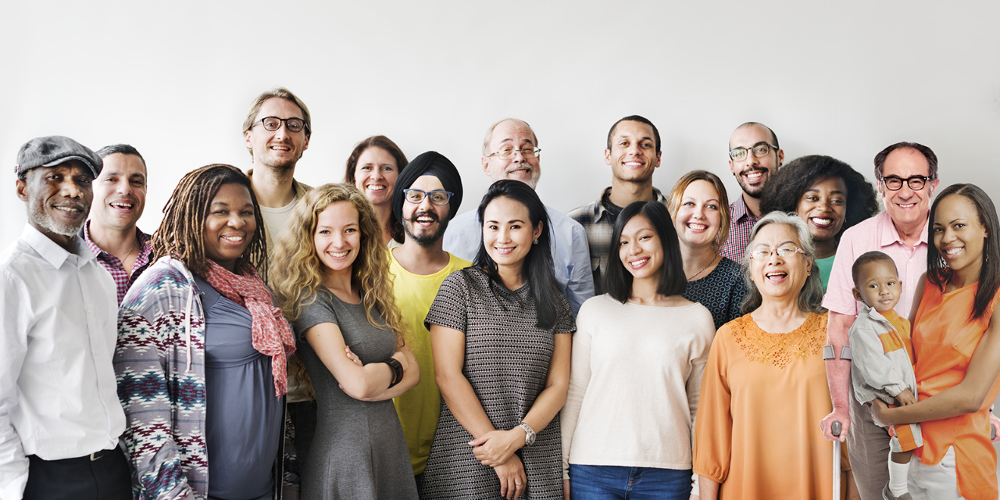

In [13]:
px.imshow(ltbx_img)

In [210]:
# image test

from time import perf_counter_ns
img = cv2.imread("./people.jpg")

start_time = perf_counter_ns()
start_time_pre = perf_counter_ns()
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img_shape = img.shape

ltbx_img = rev_letterbox(img, 640, stride=32)

tot_time_pre = (perf_counter_ns()-start_time_pre)

# px.imshow(ltbx_img).show()
# print(img.shape)
# print(ltbx_img.shape)
start_time_mov = perf_counter_ns()


tensorimg = transforms.ToTensor()(ltbx_img)
np_tensorimg = tensorimg.numpy()
tensorimg = torch.tensor(np.array([
    np_tensorimg
]))
tensorimg = tensorimg.to(DEVICE)
tensorimg = tensorimg.half() if HALF_CAPABLE else tensorimg.float()

tot_time_mov = (perf_counter_ns()-start_time_mov)


start_time_inf = perf_counter_ns()

with torch.no_grad():
    out = model(tensorimg)

tot_time_inf = (perf_counter_ns()-start_time_inf)

inf_out, attn, bases, sem_output = out['test'], out['attn'], out['bases'], out['sem']

bases = torch.cat([bases, sem_output], dim=1)

_, _, h, w = tensorimg.shape

names = model.names

start_time_nms = perf_counter_ns()

# out, out_mask, _, _, _ = non_max_suppression_mask_conf(
#     inf_out,
#     attn,
#     bases,
#     pooler,
#     HYPERPARAMETERS,
#     conf_thres=ARGS['conf-thres'],
#     iou_thres=ARGS['iou-thres'],
#     merge=False,
#     mask_iou=None)


out, out_mask = rev_non_max_suppression_mask_conf(
    inf_out,
    attn,
    bases,
    HYPERPARAMETERS["attn_resolution"],
    HYPERPARAMETERS["num_base"],
    pooler,
    conf_thres=ARGS['conf-thres'],
    iou_thres=ARGS['iou-thres'])

# pred, pred_masks = out[0], out_mask[0]  # redesign this so its in batches

tot_time_nms = (perf_counter_ns()-start_time_nms)

start_time_loop = perf_counter_ns()

total_mask_nps = [torch.zeros(ltbx_img.shape)] * len(out)

i = 0

for pred, pred_masks in zip(out, out_mask):
    if pred is not None:
        bboxes = Boxes(pred[:, :4])
        ori_pred_masks = pred_masks.view(-1, HYPERPARAMETERS['mask_resolution'], HYPERPARAMETERS['mask_resolution'])
        pred_masks = retry_if_cuda_oom(paste_masks_in_image)(ori_pred_masks, bboxes, (h, w), threshold=0.5)

        # pytorch doesn't have a bitwise_or.reduce, so transpose and any is used instead, improves time by half
        pred_masks = torch.transpose(pred_masks, 1, 0)
        total_mask = torch.any(pred_masks, dim=1)
        total_mask_nps[i] = total_mask.detach().cpu().numpy()

    i += 1

tot_time_loop = (perf_counter_ns()-start_time_loop)
tot_time = (perf_counter_ns()-start_time)

color = [np.random.randint(255), np.random.randint(255), np.random.randint(255)]
ltbx_img[total_mask_nps[0]] = ltbx_img[total_mask_nps[0]] * 0.5 + np.array(color, dtype=np.uint8) * 0.5
img_disp = cv2.resize(ltbx_img, (img_shape[1], img_shape[0]))

print(1000/(tot_time_pre*0.000001))
print(1000/(tot_time_mov*0.000001))
print(1000/(tot_time_inf*0.000001))
print(1000/(tot_time_nms*0.000001))
print(1000/(tot_time_loop*0.000001))
print(1000/(tot_time*0.000001))


953.0471777413925
776.0233614072718
69.16463985453294
410.57611218910154
984.2684375624397
48.822780240561556


In [219]:
bboxes.tensor.detach().cpu().numpy().astype(int)

array([], shape=(0, 4), dtype=int64)

In [215]:
nbboxes.shape

(18, 4)

In [83]:
px.imshow(total_mask_nps[0]).show()



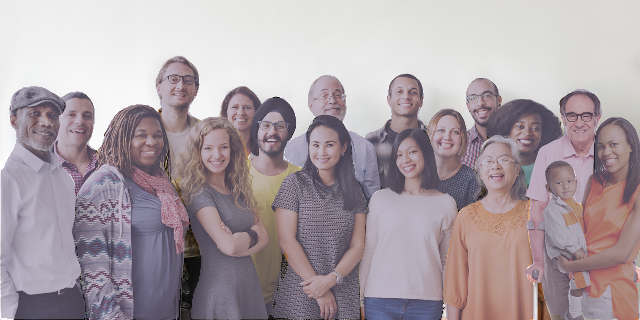

In [ ]:
px.imshow(ltbx_img).show()


In [ ]:
import sys
import os
sys.path.insert(0, os.path.abspath("../"))

# arguments
ARGS = {
    'weights': '../libs/yolov7-mask/yolov7-mask.pt',
    'img-size': 640,
    'conf-thres': 0.5,
    'iou-thres': 0.45,
    'hyp': '../libs/yolov7-mask/data/hyp.scratch.mask.yaml',
    'seed': 1,
    'thickness': 1,
    'no-bbox': True,
    'no-label': True,
    'show-fps': True,
}


In [ ]:
# testing tensorrt
import torch_tensorrt
import argparse
import time
from pathlib import Path

import cv2
import torch
import torchvision
from torchvision import transforms
import yaml
import numpy as np

from tqdm.auto import tqdm
import matplotlib.pyplot as plt
import plotly.express as px
import uuid
import av
from IPython.display import HTML
from base64 import b64encode
import subprocess

from detectron2.modeling.poolers import ROIPooler
from detectron2.structures import Boxes
from detectron2.utils.memory import retry_if_cuda_oom
from detectron2.layers import paste_masks_in_image

from utils.datasets import letterbox
from utils.general import non_max_suppression_mask_conf, increment_path


In [ ]:
# model initialization
np.random.seed(ARGS['seed'])
DEVICE = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

HALF_CAPABLE = DEVICE.type != "cpu"

print(DEVICE.type)

weights = torch.load(ARGS['weights'])
model = weights['model'].to(DEVICE)

model.eval()

CLASSES = model.names
print(CLASSES)

# if HALF_CAPABLE:
#     model = model.half()
# else:
#     model = model.float()

with open(ARGS['hyp']) as f:
    HYPERPARAMETERS = yaml.load(f, Loader=yaml.FullLoader)

pooler = ROIPooler(
    output_size=HYPERPARAMETERS['mask_resolution'],
    scales=(model.pooler_scale,),
    sampling_ratio=1,
    pooler_type='ROIAlignV2',
    canonical_level=2)


cuda
['person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus', 'train', 'truck', 'boat', 'traffic light', 'fire hydrant', 'stop sign', 'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse', 'sheep', 'cow', 'elephant', 'bear', 'zebra', 'giraffe', 'backpack', 'umbrella', 'handbag', 'tie', 'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball', 'kite', 'baseball bat', 'baseball glove', 'skateboard', 'surfboard', 'tennis racket', 'bottle', 'wine glass', 'cup', 'fork', 'knife', 'spoon', 'bowl', 'banana', 'apple', 'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza', 'donut', 'cake', 'chair', 'couch', 'potted plant', 'bed', 'dining table', 'toilet', 'tv', 'laptop', 'mouse', 'remote', 'keyboard', 'cell phone', 'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'book', 'clock', 'vase', 'scissors', 'teddy bear', 'hair drier', 'toothbrush']


In [ ]:
img = cv2.imread("./people.jpg")

start_time = perf_counter_ns()

img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img_shape = img.shape

ltbx_img = letterbox(img, 640, stride=32)[0]
tensorimg = transforms.ToTensor()(ltbx_img)
tensorimg = torch.tensor(np.array([tensorimg.numpy()]))
tensorimg = tensorimg.to(DEVICE)
tensorimg = tensorimg.half() if HALF_CAPABLE else tensorimg.float()


In [ ]:
img2 = cv2.imread("./people.jpg")

start_time = perf_counter_ns()

img2 = cv2.cvtColor(img2[100:300, :, :], cv2.COLOR_BGR2RGB)
img2_shape = img2.shape

ltbx_img2 = letterbox(img2, 320, stride=32)[0]
# px.imshow(ltbx_img).show()
# print(img.shape)
# print(ltbx_img.shape)


tensorimg2 = transforms.ToTensor()(ltbx_img2)
tensorimg2 = torch.tensor(np.array([tensorimg2.numpy()]))
tensorimg2 = tensorimg2.to(DEVICE)
tensorimg2 = tensorimg2.half() if HALF_CAPABLE else tensorimg2.float()


In [ ]:
# patch this in yolo.py file to try
# comment
# output["mask_iou"] = None (:373)
# output["bbox_and_cls"] = x[0] (:386)


In [ ]:
# trace with blank example, then run it for 10 times alternating(t/f)
ts_model = torch.jit.trace(model, tensorimg2, check_trace=False, strict=False)
ts_model(tensorimg)
ts_model(tensorimg2)
ts_model(tensorimg)
ts_model(tensorimg2)
ts_model(tensorimg)
ts_model(tensorimg2)
ts_model(tensorimg)
ts_model(tensorimg2)


RuntimeError: Tracer cannot infer type of {'mask_iou': None, 'test': tensor([[[5.29688e+00, 4.58594e+00, 9.39062e+00,  ..., 1.49536e-03, 6.66618e-04, 1.32465e-03],
         [1.18672e+01, 5.15625e+00, 1.67031e+01,  ..., 1.44386e-03, 7.20978e-04, 1.21117e-03],
         [1.87812e+01, 5.40625e+00, 2.58438e+01,  ..., 2.13242e-03, 9.69887e-04, 1.51253e-03],
         ...,
         [2.33750e+02, 5.48438e+01, 2.45875e+02,  ..., 4.98199e-03, 4.57382e-03, 2.64168e-03],
         [2.66500e+02, 5.70938e+01, 1.64000e+02,  ..., 4.71878e-03, 3.12424e-03, 2.58064e-03],
         [2.91250e+02, 5.49375e+01, 1.44000e+02,  ..., 5.24139e-03, 3.55148e-03, 2.81143e-03]]], device='cuda:0', dtype=torch.float16), 'attn': tensor([[[ 0.04712,  0.03772,  0.07904,  ..., -0.63281, -0.53320, -0.56250],
         [ 0.09033,  0.06793,  0.10211,  ..., -0.59766, -0.50098, -0.53906],
         [ 0.16589,  0.13293,  0.15613,  ..., -0.56152, -0.46313, -0.50732],
         ...,
         [ 0.14465,  0.15002,  0.14514,  ...,  0.06873,  0.01489, -0.00928],
         [ 0.15930,  0.16309,  0.15723,  ...,  0.07697,  0.02112,  0.00143],
         [ 0.13794,  0.14111,  0.13403,  ...,  0.05066, -0.00362, -0.02252]]], device='cuda:0', dtype=torch.float16), 'bbox_and_cls': [tensor([[[[[ 2.17407e-01,  9.68018e-02, -2.31934e-01,  ..., -6.50391e+00, -7.31250e+00, -6.62500e+00],
           [-2.28882e-02,  1.94092e-01,  3.62793e-01,  ..., -6.53906e+00, -7.23438e+00, -6.71484e+00],
           [-2.02515e-01,  2.36328e-01,  1.01367e+00,  ..., -6.14844e+00, -6.93750e+00, -6.49219e+00],
           ...,
           [ 1.04004e+00,  2.96387e-01,  5.49316e-01,  ..., -6.29297e+00, -6.84766e+00, -6.40625e+00],
           [ 8.54980e-01,  2.05566e-01,  1.02051e-01,  ..., -6.63281e+00, -6.92969e+00, -6.42578e+00],
           [ 2.68555e-01,  1.10962e-01, -5.74219e-01,  ..., -6.45312e+00, -6.94141e+00, -6.10938e+00]],

          [[-1.06628e-01, -8.51440e-02, -5.54688e-01,  ..., -6.89453e+00, -7.38281e+00, -6.55469e+00],
           [-2.23999e-01,  1.13037e-01,  5.54688e-01,  ..., -6.96094e+00, -7.34375e+00, -6.70312e+00],
           [-3.19824e-01, -2.54517e-02,  1.25000e+00,  ..., -6.79688e+00, -7.03906e+00, -6.48047e+00],
           ...,
           [ 6.33789e-01,  1.52222e-01,  1.00977e+00,  ..., -6.85547e+00, -7.00000e+00, -6.46875e+00],
           [ 5.98145e-01,  3.94775e-01,  3.48145e-01,  ..., -7.04688e+00, -7.19531e+00, -6.72266e+00],
           [ 1.46606e-01,  9.80469e-01, -5.48828e-01,  ..., -6.79297e+00, -7.16797e+00, -6.44141e+00]],

          [[ 9.51385e-03,  1.01562e+00, -3.32031e-01,  ..., -6.95703e+00, -7.45312e+00, -6.56250e+00],
           [-3.11523e-01,  4.96094e-01,  5.57617e-01,  ..., -7.16797e+00, -7.57812e+00, -7.06641e+00],
           [-4.12354e-01,  7.09473e-01,  1.18750e+00,  ..., -6.89062e+00, -7.37109e+00, -6.88672e+00],
           ...,
           [ 8.23242e-01,  5.01465e-01,  1.04102e+00,  ..., -6.80078e+00, -7.19531e+00, -6.69531e+00],
           [ 8.77930e-01,  2.00439e-01,  1.94092e-01,  ..., -6.82422e+00, -7.34375e+00, -6.97266e+00],
           [ 2.34497e-01,  2.58301e-01, -6.66016e-01,  ..., -6.47656e+00, -7.24609e+00, -6.57422e+00]],

          ...,

          [[ 2.08203e+00, -3.26538e-02,  6.16211e-01,  ..., -7.01562e+00, -7.67969e+00, -7.50391e+00],
           [ 1.20410e+00, -8.44116e-02,  1.22363e+00,  ..., -7.33594e+00, -7.75781e+00, -7.75781e+00],
           [-2.99805e-01, -9.56421e-02,  1.25684e+00,  ..., -7.43750e+00, -7.85547e+00, -7.86719e+00],
           ...,
           [-1.38379e+00,  1.09375e-01,  1.16602e+00,  ..., -7.69531e+00, -8.07031e+00, -8.07031e+00],
           [-1.94238e+00,  1.63818e-01,  1.70996e+00,  ..., -7.15234e+00, -7.74609e+00, -7.62891e+00],
           [-4.24561e-01,  3.25195e-01, -1.38184e-01,  ..., -6.99219e+00, -7.55469e+00, -6.89453e+00]],

          [[ 1.41724e-01, -1.01074e+00, -4.72656e-01,  ..., -6.79688e+00, -7.50391e+00, -6.82812e+00],
           [ 7.96387e-01, -1.48438e+00,  1.16211e+00,  ..., -7.12891e+00, -7.49609e+00, -7.42969e+00],
           [-3.16895e-01, -1.81445e+00,  1.19434e+00,  ..., -7.10547e+00, -7.50781e+00, -7.53516e+00],
           ...,
           [-5.47363e-01, -1.37695e+00,  1.91992e+00,  ..., -7.49609e+00, -7.82422e+00, -7.91797e+00],
           [-8.34473e-01, -7.28027e-01,  1.12695e+00,  ..., -6.98438e+00, -7.50391e+00, -7.22656e+00],
           [-5.42969e-01, -2.09961e-01, -7.71484e-02,  ..., -6.75781e+00, -7.21875e+00, -6.46484e+00]],

          [[ 9.86816e-01, -2.14355e-01,  3.52295e-01,  ..., -6.48828e+00, -7.28516e+00, -6.20312e+00],
           [ 4.00146e-01, -5.44922e-01,  1.35645e+00,  ..., -6.64062e+00, -7.54297e+00, -6.65625e+00],
           [-5.00000e-01, -5.35156e-01,  1.64844e+00,  ..., -7.13672e+00, -7.82422e+00, -7.16016e+00],
           ...,
           [ 2.92480e-01, -5.31738e-01,  1.12891e+00,  ..., -6.50000e+00, -7.50391e+00, -6.95703e+00],
           [ 4.95605e-01, -1.46240e-01,  1.19385e-01,  ..., -6.25000e+00, -7.39062e+00, -6.95312e+00],
           [-1.92627e-01,  3.84827e-02, -7.42188e-02,  ..., -6.23828e+00, -7.12109e+00, -6.32422e+00]]],


         [[[ 4.88281e-01,  5.70374e-02, -3.47656e-01,  ..., -7.03125e+00, -8.50000e+00, -6.90234e+00],
           [-1.09009e-01,  9.54590e-02,  1.30493e-01,  ..., -7.21484e+00, -8.46094e+00, -7.00391e+00],
           [-2.64160e-01,  5.46875e-02,  8.54492e-01,  ..., -7.14844e+00, -8.37500e+00, -6.94141e+00],
           ...,
           [ 7.85645e-01, -5.31006e-03,  6.59668e-01,  ..., -7.23828e+00, -8.37500e+00, -6.92969e+00],
           [ 3.52539e-01, -4.63257e-02,  1.41113e-01,  ..., -7.24609e+00, -8.35938e+00, -6.78906e+00],
           [-2.71484e-01, -5.59692e-02, -3.75488e-01,  ..., -7.01172e+00, -8.54688e+00, -6.45312e+00]],

          [[ 1.12061e-01, -3.47168e-01, -6.21582e-01,  ..., -7.07422e+00, -8.01562e+00, -6.85938e+00],
           [-3.90015e-02,  5.08728e-02,  1.43311e-01,  ..., -7.28516e+00, -7.94141e+00, -7.01172e+00],
           [-2.07153e-01,  2.59521e-01,  8.56445e-01,  ..., -7.26953e+00, -7.78125e+00, -6.91797e+00],
           ...,
           [ 6.18164e-01,  6.93359e-01,  7.15332e-01,  ..., -7.33594e+00, -7.85156e+00, -6.97266e+00],
           [ 5.41992e-01,  9.11133e-01, -2.44141e-04,  ..., -7.35547e+00, -7.89844e+00, -7.11719e+00],
           [-1.73462e-01,  1.20801e+00, -5.43457e-01,  ..., -7.12109e+00, -8.10938e+00, -6.88672e+00]],

          [[ 1.31348e-01,  1.45898e+00, -5.79102e-01,  ..., -7.36328e+00, -8.31250e+00, -7.00781e+00],
           [-2.62939e-01,  6.32812e-01,  3.36304e-02,  ..., -7.64844e+00, -8.39844e+00, -7.46484e+00],
           [-4.27734e-01,  8.86230e-01,  7.68555e-01,  ..., -7.61328e+00, -8.30469e+00, -7.50000e+00],
           ...,
           [ 6.49902e-01,  6.65527e-01,  7.48047e-01,  ..., -7.58984e+00, -8.37500e+00, -7.32031e+00],
           [ 5.10254e-01,  2.99316e-01, -5.43213e-02,  ..., -7.44922e+00, -8.28125e+00, -7.38281e+00],
           [-5.21240e-02,  3.60352e-01, -6.84082e-01,  ..., -7.08594e+00, -8.36719e+00, -6.98047e+00]],

          ...,

          [[ 3.17188e+00, -7.74536e-02,  3.76465e-01,  ..., -7.94531e+00, -8.53906e+00, -8.46094e+00],
           [ 1.21680e+00, -1.08704e-01,  4.92676e-01,  ..., -8.70312e+00, -8.85156e+00, -8.89844e+00],
           [-2.89062e-01, -1.19568e-01,  4.98535e-01,  ..., -8.83594e+00, -8.99219e+00, -9.04688e+00],
           ...,
           [-1.17090e+00,  1.02783e-01,  4.40430e-01,  ..., -8.80469e+00, -8.98438e+00, -9.01562e+00],
           [-2.70312e+00,  1.36719e-01,  7.66602e-01,  ..., -8.28906e+00, -8.85938e+00, -8.61719e+00],
           [-1.36816e+00,  4.79126e-02,  8.05664e-03,  ..., -7.29297e+00, -8.75781e+00, -7.30859e+00]],

          [[ 3.75977e-01, -1.53223e+00, -5.63477e-01,  ..., -7.31250e+00, -8.42188e+00, -7.50781e+00],
           [ 6.68945e-01, -1.65332e+00,  5.59082e-01,  ..., -8.62500e+00, -8.69531e+00, -8.73438e+00],
           [-3.00781e-01, -1.84375e+00,  4.76562e-01,  ..., -8.78906e+00, -8.85938e+00, -8.90625e+00],
           ...,
           [-4.31152e-01, -1.42578e+00,  7.68555e-01,  ..., -8.71875e+00, -8.86719e+00, -8.96875e+00],
           [-1.75684e+00, -1.23340e+00,  9.70703e-01,  ..., -7.99609e+00, -8.83594e+00, -8.18750e+00],
           [-1.36523e+00, -8.13965e-01,  9.69849e-02,  ..., -7.10156e+00, -8.65625e+00, -6.86719e+00]],

          [[ 1.64453e+00, -5.39551e-01,  1.73584e-01,  ..., -7.09766e+00, -9.05469e+00, -6.80859e+00],
           [ 7.78320e-01, -6.76270e-01,  6.93848e-01,  ..., -7.33203e+00, -9.13281e+00, -7.26562e+00],
           [-4.74121e-01, -6.16211e-01,  8.69141e-01,  ..., -7.63281e+00, -9.00781e+00, -7.86719e+00],
           ...,
           [-1.04614e-01, -8.01758e-01,  1.02246e+00,  ..., -7.43359e+00, -9.21875e+00, -7.83594e+00],
           [-1.28662e-01, -4.56787e-01,  2.28516e-01,  ..., -7.08984e+00, -9.10156e+00, -7.62891e+00],
           [-1.01562e+00, -1.83105e-01,  2.64893e-02,  ..., -6.92969e+00, -9.04688e+00, -6.84375e+00]]],


         [[[ 8.94043e-01,  8.52051e-02, -5.06348e-01,  ..., -5.65234e+00, -6.69141e+00, -6.61719e+00],
           [ 3.03223e-01,  2.70508e-01, -1.51367e-01,  ..., -5.63281e+00, -6.77734e+00, -6.70312e+00],
           [ 7.15942e-02,  2.73193e-01,  4.75342e-01,  ..., -5.26953e+00, -6.67188e+00, -6.57422e+00],
           ...,
           [ 7.43652e-01,  2.35107e-01,  3.13232e-01,  ..., -5.39453e+00, -6.51953e+00, -6.48047e+00],
           [ 2.03857e-01,  1.81885e-01, -1.79688e-01,  ..., -5.73438e+00, -6.46094e+00, -6.41797e+00],
           [-5.30762e-01,  2.54822e-02, -4.98291e-01,  ..., -5.76953e+00, -6.41016e+00, -6.23047e+00]],

          [[ 5.19531e-01, -2.91992e-01, -7.78809e-01,  ..., -5.87109e+00, -6.59375e+00, -6.39844e+00],
           [ 1.77734e-01,  7.37305e-02, -3.79883e-01,  ..., -6.07812e+00, -6.79688e+00, -6.60156e+00],
           [ 1.41907e-03,  1.74683e-01,  3.10791e-01,  ..., -5.91797e+00, -6.64062e+00, -6.44922e+00],
           ...,
           [ 5.14160e-01,  4.94385e-01,  1.09131e-01,  ..., -6.00781e+00, -6.57812e+00, -6.46484e+00],
           [ 4.08203e-01,  7.69531e-01, -4.99023e-01,  ..., -6.18750e+00, -6.60156e+00, -6.58984e+00],
           [-4.33105e-01,  1.08691e+00, -7.17773e-01,  ..., -5.91406e+00, -6.44141e+00, -6.37500e+00]],

          [[ 3.68164e-01,  1.36328e+00, -9.32129e-01,  ..., -6.24219e+00, -6.72656e+00, -6.44141e+00],
           [-1.81885e-01,  5.99609e-01, -5.65918e-01,  ..., -6.58203e+00, -6.97656e+00, -6.91406e+00],
           [-2.63184e-01,  8.10547e-01, -1.70898e-03,  ..., -6.25391e+00, -6.92188e+00, -6.85938e+00],
           ...,
           [ 5.34180e-01,  6.09863e-01, -1.07910e-01,  ..., -6.23047e+00, -6.80078e+00, -6.74609e+00],
           [ 3.33496e-01,  2.90527e-01, -5.80078e-01,  ..., -6.14844e+00, -6.73047e+00, -6.82422e+00],
           [-3.72070e-01,  3.33984e-01, -8.26660e-01,  ..., -5.81641e+00, -6.58203e+00, -6.53906e+00]],

          ...,

          [[ 3.01953e+00, -4.97437e-02, -3.77930e-01,  ..., -5.98828e+00, -6.91406e+00, -7.01172e+00],
           [ 1.20020e+00, -1.16760e-01, -2.97852e-01,  ..., -5.86328e+00, -6.87500e+00, -6.86328e+00],
           [-3.06396e-01, -1.29150e-01, -2.96387e-01,  ..., -5.92188e+00, -6.92188e+00, -6.92188e+00],
           ...,
           [-1.16602e+00,  1.01562e-01, -3.56201e-01,  ..., -6.07812e+00, -7.01172e+00, -7.05469e+00],
           [-2.42578e+00,  1.78833e-01, -1.26221e-01,  ..., -6.33984e+00, -7.08984e+00, -7.19531e+00],
           [-1.50684e+00,  9.89990e-02, -3.31543e-01,  ..., -7.04688e+00, -7.14844e+00, -7.13281e+00]],

          [[ 6.65527e-01, -1.16602e+00, -8.32031e-01,  ..., -5.80469e+00, -6.53125e+00, -6.47656e+00],
           [ 6.37207e-01, -9.62891e-01, -2.91992e-01,  ..., -5.87891e+00, -6.78906e+00, -6.70703e+00],
           [-3.08350e-01, -1.18945e+00, -3.37891e-01,  ..., -5.76172e+00, -6.78125e+00, -6.73047e+00],
           ...,
           [-4.42383e-01, -1.23047e+00, -1.54053e-01,  ..., -6.17578e+00, -7.00781e+00, -7.09375e+00],
           [-1.48340e+00, -7.41699e-01,  1.36719e-02,  ..., -6.34375e+00, -6.95703e+00, -6.93359e+00],
           [-1.51660e+00, -6.44531e-01, -1.40625e-01,  ..., -6.64062e+00, -6.81641e+00, -6.64062e+00]],

          [[ 1.81250e+00, -3.58154e-01, -3.13721e-01,  ..., -6.21875e+00, -6.75391e+00, -6.44141e+00],
           [ 8.02246e-01, -5.58105e-01, -7.83691e-02,  ..., -6.60547e+00, -7.12500e+00, -6.88672e+00],
           [-3.59131e-01, -5.72754e-01,  4.22363e-02,  ..., -6.99609e+00, -7.36328e+00, -7.33203e+00],
           ...,
           [-4.30908e-02, -5.62988e-01,  2.52686e-01,  ..., -6.16016e+00, -7.14062e+00, -7.26172e+00],
           [-1.59912e-01, -3.03955e-01, -1.85547e-01,  ..., -5.76172e+00, -6.76562e+00, -7.07812e+00],
           [-1.13477e+00, -7.48901e-02, -2.92480e-01,  ..., -6.07031e+00, -6.64453e+00, -6.60938e+00]]]]], device='cuda:0', dtype=torch.float16), tensor([[[[[ 0.17200,  0.47949, -0.02881,  ..., -6.34766, -6.50000, -7.42578],
           [ 0.08130,  0.41382,  0.58203,  ..., -6.46094, -6.86328, -7.47266],
           [-0.02170,  0.69727,  1.17969,  ..., -6.49609, -6.88672, -7.53906],
           ...,
           [-0.14380,  0.47021,  1.12891,  ..., -6.30469, -6.75000, -7.46094],
           [-0.07056,  0.50391,  0.51416,  ..., -6.46094, -6.86719, -7.53516],
           [-0.18982,  0.40381,  0.30591,  ..., -6.24219, -6.58203, -7.57812]],

          [[ 0.66016,  0.81152,  0.02954,  ..., -7.23047, -7.28516, -7.66797],
           [-0.48364,  2.08984, -0.17432,  ..., -7.64844, -7.95703, -8.09375],
           [ 0.02574,  0.86475,  0.92969,  ..., -7.14062, -7.33594, -7.56641],
           ...,
           [-0.20129,  1.48340,  1.24609,  ..., -7.28125, -7.52734, -7.72656],
           [ 0.04218,  2.47852, -0.01123,  ..., -7.45703, -7.80078, -8.03125],
           [-0.89209,  0.95605,  0.32227,  ..., -6.86719, -7.19141, -7.73438]],

          [[ 0.88135,  0.26831, -0.16309,  ..., -8.17188, -8.46094, -8.56250],
           [-0.49707,  0.27295, -0.16455,  ..., -8.39062, -8.53125, -8.65625],
           [-0.07056,  0.40479, -0.57373,  ..., -8.24219, -8.41406, -8.53906],
           ...,
           [ 0.94482,  0.42065, -0.25635,  ..., -8.35938, -8.61719, -8.79688],
           [-0.27051,  0.42139, -0.18311,  ..., -8.50000, -8.59375, -8.75781],
           [-1.36523,  0.36963,  0.09790,  ..., -7.59375, -8.11719, -8.50781]],

          [[ 0.68408, -1.07910, -0.11914,  ..., -7.54688, -7.86719, -8.17969],
           [-0.50586, -1.26074, -0.16357,  ..., -7.63281, -8.13281, -8.28906],
           [-0.09949, -1.09766, -0.56689,  ..., -7.91797, -8.23438, -8.38281],
           ...,
           [-0.33911, -0.73291,  1.10352,  ..., -7.69141, -8.08594, -8.28906],
           [ 0.13123, -1.07520,  0.12061,  ..., -8.25000, -8.42188, -8.57812],
           [-1.06055, -0.92969,  0.15747,  ..., -7.49219, -7.71094, -8.18750]]],


         [[[ 0.24829,  0.51318, -0.50928,  ..., -7.01172, -7.82031, -6.33984],
           [ 0.13513,  0.46021, -0.10254,  ..., -7.16016, -7.84766, -6.80469],
           [-0.03723,  0.73145,  0.26807,  ..., -7.19922, -7.93750, -6.83984],
           ...,
           [-0.14136,  0.51953,  0.19958,  ..., -7.10547, -7.90234, -6.68750],
           [-0.02510,  0.54297, -0.19128,  ..., -7.14062, -7.84375, -6.65234],
           [-0.25806,  0.44800, -0.07947,  ..., -7.12500, -8.03125, -6.42969]],

          [[ 0.70752,  0.93799, -0.58057,  ..., -7.34375, -7.85547, -7.48438],
           [-0.47729,  2.20312, -0.77783,  ..., -7.55078, -7.81641, -7.63672],
           [-0.07092,  1.03320,  0.31885,  ..., -7.40234, -8.02344, -7.57812],
           ...,
           [-0.24243,  1.70117,  0.25781,  ..., -7.37109, -8.07031, -7.71875],
           [ 0.07898,  2.63672, -0.64648,  ..., -7.59375, -8.03906, -7.80078],
           [-0.94141,  1.06543, -0.25220,  ..., -7.23438, -8.00000, -7.23438]],

          [[ 0.87354,  0.26807, -0.79980,  ..., -7.89062, -8.17188, -8.25000],
           [-0.52002,  0.28540, -0.79980,  ..., -8.01562, -8.30469, -8.37500],
           [-0.11389,  0.40063, -1.10645,  ..., -7.96094, -8.29688, -8.31250],
           ...,
           [ 0.93018,  0.40161, -0.89014,  ..., -8.13281, -8.57031, -8.67188],
           [-0.25830,  0.37231, -0.82764,  ..., -8.10938, -8.53906, -8.63281],
           [-1.36719,  0.39111, -0.61328,  ..., -7.53906, -8.28125, -8.08594]],

          [[ 0.70898, -1.14258, -0.74170,  ..., -7.48828, -8.00000, -7.87109],
           [-0.52490, -1.20508, -0.79688,  ..., -7.57031, -7.97656, -7.89844],
           [-0.11548, -1.05762, -1.05566,  ..., -7.60547, -8.07031, -7.92969],
           ...,
           [-0.30811, -0.73779,  0.06775,  ..., -7.21484, -8.28125, -8.21094],
           [ 0.15259, -1.06250, -0.59473,  ..., -7.76562, -8.29688, -8.34375],
           [-1.04492, -0.96729, -0.54639,  ..., -7.12109, -8.04688, -7.66797]]],


         [[[ 0.23413,  0.55859, -0.43896,  ..., -5.27734, -5.97266, -5.60156],
           [ 0.13477,  0.46948, -0.01733,  ..., -5.33984, -6.25391, -5.82812],
           [-0.03699,  0.72119,  0.36182,  ..., -5.33984, -6.25000, -5.84375],
           ...,
           [-0.15405,  0.50342,  0.29199,  ..., -5.22266, -6.20312, -5.73047],
           [-0.03894,  0.57568, -0.11841,  ..., -5.25391, -6.22266, -5.76172],
           [-0.24146,  0.47339,  0.01880,  ..., -5.20312, -6.07812, -5.67578]],

          [[ 0.67627,  0.40503, -0.52344,  ..., -5.76172, -6.52734, -6.43359],
           [-0.44067,  1.07910, -0.71973,  ..., -5.67578, -6.64453, -6.43359],
           [-0.07153,  0.33789,  0.43115,  ..., -5.80859, -6.70703, -6.39453],
           ...,
           [-0.26294,  0.70996,  0.39502,  ..., -5.96484, -6.89844, -6.55469],
           [ 0.09912,  1.36328, -0.57324,  ..., -5.71094, -6.78516, -6.56641],
           [-0.91309,  0.50195, -0.17688,  ..., -5.56641, -6.53906, -6.27734]],

          [[ 0.84277,  0.18713, -0.72998,  ..., -5.83203, -6.78125, -6.78516],
           [-0.51562,  0.19617, -0.73096,  ..., -6.03906, -6.89453, -6.91797],
           [-0.10938,  0.21692, -1.05566,  ..., -6.04297, -6.99219, -6.91797],
           ...,
           [ 0.88086,  0.19617, -0.80176,  ..., -6.16406, -7.16016, -7.16016],
           [-0.22534,  0.17065, -0.75146,  ..., -6.25000, -7.14453, -7.14062],
           [-1.31250,  0.13440, -0.54688,  ..., -5.61719, -6.75781, -6.79688]],

          [[ 0.67480, -0.52832, -0.68555,  ..., -5.82422, -6.76953, -6.78516],
           [-0.50293, -0.68359, -0.73193,  ..., -5.66406, -6.71875, -6.66016],
           [-0.09698, -0.58984, -1.00977,  ..., -5.93359, -6.92969, -6.83203],
           ...,
           [-0.28467, -0.56543,  0.16199,  ..., -6.22656, -7.24219, -7.18750],
           [ 0.15601, -0.55811, -0.51660,  ..., -6.15234, -7.05859, -7.03125],
           [-1.00195, -0.43604, -0.47754,  ..., -5.85156, -6.73828, -6.74609]]]]], device='cuda:0', dtype=torch.float16), tensor([[[[[ 9.86816e-01,  3.12988e-01,  7.36328e-01,  ..., -7.10156e+00, -8.18750e+00, -7.75391e+00],
           [ 4.19189e-01,  5.15625e-01,  5.84473e-01,  ..., -6.93359e+00, -8.25781e+00, -7.60156e+00],
           [ 1.07300e-01,  4.83643e-01,  1.94824e+00,  ..., -6.63281e+00, -8.11719e+00, -7.35547e+00],
           ...,
           [-4.28955e-01,  7.35352e-01,  6.21582e-01,  ..., -6.99219e+00, -8.25000e+00, -7.71094e+00],
           [-1.96899e-01,  9.37012e-01, -1.56006e-01,  ..., -6.96875e+00, -8.30469e+00, -7.69141e+00],
           [-7.22168e-01,  6.11328e-01, -1.13098e-01,  ..., -6.86328e+00, -8.26562e+00, -7.78906e+00]],

          [[ 1.32324e-01,  2.74170e-01,  8.61328e-01,  ..., -7.17578e+00, -8.24219e+00, -8.00000e+00],
           [ 1.65405e-01,  2.54639e-01,  3.08398e+00,  ..., -6.78125e+00, -7.94922e+00, -7.16016e+00],
           [ 1.60400e-01, -5.06348e-01, -6.66504e-01,  ..., -7.69922e+00, -8.83594e+00, -8.62500e+00],
           ...,
           [-1.73462e-01, -9.20105e-03,  5.92773e-01,  ..., -7.08984e+00, -8.35156e+00, -7.73828e+00],
           [-2.08130e-01, -3.63770e-02, -1.66992e-01,  ..., -7.51172e+00, -8.48438e+00, -8.16406e+00],
           [-9.51660e-01, -4.68750e-02, -3.23242e-01,  ..., -7.08203e+00, -8.35938e+00, -7.94531e+00]]],


         [[[ 9.27246e-01, -1.12152e-03,  2.67090e-01,  ..., -6.04688e+00, -7.03516e+00, -6.87500e+00],
           [ 3.11768e-01,  1.70044e-01,  2.36206e-01,  ..., -5.79297e+00, -6.83984e+00, -6.67969e+00],
           [ 6.31714e-02, -3.14941e-01,  8.77441e-01,  ..., -5.50391e+00, -6.67188e+00, -6.34766e+00],
           ...,
           [-5.10742e-01,  2.53418e-01,  2.76367e-01,  ..., -5.82422e+00, -6.92969e+00, -6.76562e+00],
           [-2.01050e-01,  3.21289e-01, -2.57568e-01,  ..., -5.76172e+00, -6.89062e+00, -6.60938e+00],
           [-7.19238e-01,  1.63696e-01, -2.77100e-01,  ..., -5.73438e+00, -6.98047e+00, -6.71484e+00]],

          [[ 1.71509e-01,  3.28369e-01,  3.23730e-01,  ..., -6.00000e+00, -7.11719e+00, -7.05859e+00],
           [ 3.13721e-02, -9.17816e-03,  1.34082e+00,  ..., -5.82031e+00, -6.72656e+00, -6.43359e+00],
           [ 1.65039e-01, -3.43994e-01, -7.82227e-01,  ..., -5.88672e+00, -7.17188e+00, -7.01562e+00],
           ...,
           [-2.87109e-01,  1.30615e-01,  2.32056e-01,  ..., -5.88281e+00, -7.02344e+00, -6.79297e+00],
           [-2.12036e-01,  2.24121e-01, -3.13965e-01,  ..., -6.13672e+00, -7.18359e+00, -6.97266e+00],
           [-9.33594e-01,  1.75049e-01, -4.50195e-01,  ..., -5.85938e+00, -7.03906e+00, -6.81250e+00]]],


         [[[ 6.53320e-01, -1.55273e-01, -5.01953e-01,  ..., -5.40625e+00, -5.58984e+00, -5.94141e+00],
           [ 2.42310e-01, -1.02844e-01, -4.56055e-01,  ..., -5.30859e+00, -5.10156e+00, -5.83594e+00],
           [ 4.77905e-02, -3.95264e-01, -3.41797e-01,  ..., -5.11719e+00, -5.14453e+00, -5.70312e+00],
           ...,
           [-4.31641e-01, -1.07910e-01, -5.00977e-01,  ..., -5.31641e+00, -5.37500e+00, -5.88672e+00],
           [-1.92139e-01, -4.59595e-02, -8.15430e-01,  ..., -5.20703e+00, -5.36328e+00, -5.77344e+00],
           [-3.90381e-01, -1.00708e-01, -8.22754e-01,  ..., -5.19141e+00, -5.60938e+00, -5.82031e+00]],

          [[ 1.35132e-01,  4.26758e-01, -4.92188e-01,  ..., -5.37891e+00, -5.73047e+00, -6.07422e+00],
           [-6.26831e-02,  2.70264e-01, -1.00098e-01,  ..., -5.27344e+00, -5.12891e+00, -5.89453e+00],
           [ 9.71069e-02, -7.45850e-02, -1.10840e+00,  ..., -5.17969e+00, -5.58984e+00, -5.79688e+00],
           ...,
           [-2.65381e-01,  2.88086e-01, -5.49805e-01,  ..., -5.29688e+00, -5.38281e+00, -5.93359e+00],
           [-2.29004e-01,  3.83545e-01, -8.53027e-01,  ..., -5.35156e+00, -5.76562e+00, -5.95703e+00],
           [-5.48340e-01,  2.90527e-01, -9.43848e-01,  ..., -5.24609e+00, -5.63672e+00, -5.87109e+00]]]]], device='cuda:0', dtype=torch.float16)], 'bases': tensor([[[[ -5.14062,  -6.64062,  -2.91016,  ...,   4.46875,   6.05469,   1.42773],
          [ -3.33594,  -1.66113,   1.04688,  ...,  10.24219,  12.67969,  11.10156],
          [  2.22852,   6.21094,   5.71875,  ...,   8.27344,   6.80469,   6.39844],
          ...,
          [ 17.04688,  -1.83008,  -8.29688,  ...,  10.06250,  19.01562,  -0.16406],
          [ 18.89062,   5.45312,   1.91602,  ...,  14.17188,  21.14062,   2.11133],
          [ 14.78125,   6.45312,   7.50000,  ...,   5.42969,  12.10156,   1.80273]],

         [[-18.96875, -34.43750, -27.73438,  ..., -49.75000, -58.93750, -53.81250],
          [-27.53125, -48.03125, -34.28125,  ..., -52.18750, -62.37500, -61.75000],
          [-28.03125, -41.09375, -37.06250,  ..., -59.34375, -67.50000, -67.43750],
          ...,
          [-48.84375, -82.50000, -55.71875,  ..., -61.93750, -70.37500, -72.75000],
          [-44.93750, -77.56250, -74.87500,  ..., -72.06250, -74.00000, -75.00000],
          [-15.78906, -38.68750, -37.15625,  ..., -57.87500, -54.81250, -56.00000]],

         [[ 12.44531,  22.64062,  17.46875,  ...,  16.28125,  20.76562,  27.32812],
          [ 19.04688,  26.95312,  15.55469,  ...,  16.40625,  20.53125,  18.84375],
          [ 18.68750,  10.00781,  11.79688,  ...,  20.51562,  24.25000,  26.59375],
          ...,
          [ 12.78906,  60.81250,  49.12500,  ...,  31.59375,  28.31250,  37.93750],
          [ 29.04688,  61.31250,  65.62500,  ...,  41.62500,  40.68750,  52.93750],
          [ 16.60938,  41.18750,  39.37500,  ...,  43.75000,  38.25000,  45.06250]],

         [[ 12.42188,  15.69531,   7.56250,  ...,  13.42969,  13.86719,  14.93750],
          [ 12.56250,  18.45312,   9.46875,  ...,   8.03906,  11.64844,  14.79688],
          [  8.50000,  18.14062,  12.47656,  ...,  12.83594,  18.51562,  21.87500],
          ...,
          [ 15.32031,  19.25000,  17.29688,  ...,  13.20312,  11.92969,  29.85938],
          [ -9.53906,   1.25879,  -2.10547,  ...,  -1.89746,  -9.42188,   8.50000],
          [-17.23438, -12.27344, -13.97656,  ...,   0.66699,  -6.85938,   0.86523]]]], device='cuda:0', dtype=torch.float16), 'sem': tensor([[[[-7.26172, -8.12500, -7.85156,  ..., -8.57812, -8.11719, -7.21094],
          [-8.65625, -8.85938, -7.93750,  ..., -8.82031, -8.62500, -7.98438],
          [-8.59375, -8.37500, -7.64453,  ..., -8.68750, -8.67188, -8.03125],
          ...,
          [-2.14062, -2.39258, -1.59277,  ..., -2.89648, -3.65039, -3.83203],
          [-2.56836, -2.04297, -1.40234,  ..., -2.78125, -3.65234, -4.10547],
          [-2.34375, -1.90527, -1.48047,  ..., -2.45312, -3.17969, -3.58203]]]], device='cuda:0', dtype=torch.float16)}
:Dictionary inputs to traced functions must have consistent type. Found Optional[Tensor] and List[Tensor]

In [ ]:
# image test

from time import perf_counter_ns
img = cv2.imread("./people.jpg")

start_time = perf_counter_ns()

img = cv2.cvtColor(img[:, :, :], cv2.COLOR_BGR2RGB)
img_shape = img.shape

ltbx_img = letterbox(img, 640, stride=32)[0]
# px.imshow(ltbx_img).show()
# print(img.shape)
# print(ltbx_img.shape)


tensorimg = transforms.ToTensor()(ltbx_img)
tensorimg = torch.tensor(np.array([tensorimg.numpy()]))
tensorimg = tensorimg.to(DEVICE)
tensorimg = tensorimg.half() if HALF_CAPABLE else tensorimg.float()

print(tensorimg.shape)

start_time_inf = perf_counter_ns()

with torch.no_grad():
    out = ts_model(tensorimg)

tot_time_inf = (perf_counter_ns()-start_time_inf)*0.000001

inf_out, attn, bases, sem_output = out['test'], out['attn'], out['bases'], out['sem']

bases = torch.cat([bases, sem_output], dim=1)

_, _, h, w = tensorimg.shape

names = model.names

start_time_nms = perf_counter_ns()

out, out_mask = rev_non_max_suppression_mask_conf(
    inf_out,
    attn,
    bases,
    pooler,
    HYPERPARAMETERS,
    conf_thres=ARGS['conf-thres'],
    iou_thres=ARGS['iou-thres'],
    classes=[0])

pred, pred_masks = out[0], out_mask[0]

tot_time_nms = (perf_counter_ns()-start_time_nms)*0.000001

start_time_loop = perf_counter_ns()

total_mask_npo = torch.zeros(ltbx_img.shape)

if pred is not None:
    ori_pred_masks = pred_masks.view(-1, HYPERPARAMETERS['mask_resolution'], HYPERPARAMETERS['mask_resolution'])
    pred_masks = retry_if_cuda_oom(paste_masks_in_image)(ori_pred_masks, bboxes, (h, w), threshold=0.5)

    # pytorch doesn't have a bitwise_or.reduce, so transpose and any is used instead, improves time by half
    pred_masks = torch.transpose(pred_masks, 1, 0)
    total_mask = torch.any(pred_masks, dim=1)
    total_mask_npo = total_mask.detach().cpu().numpy()

    color = [np.random.randint(255), np.random.randint(255), np.random.randint(255)]
    ltbx_img[total_mask_npo] = ltbx_img[total_mask_npo] * 0.5 + np.array(color, dtype=np.uint8) * 0.5

tot_time = (perf_counter_ns()-start_time)*0.000001
tot_time_loop = (perf_counter_ns()-start_time_loop)*0.000001
img_disp = cv2.resize(img_disp, (img_shape[1], img_shape[0]))

print(1000/tot_time_inf)
print(1000/tot_time_nms)
print(1000/tot_time_loop)
print(1000/tot_time)


torch.Size([1, 3, 320, 640])
79.05358940055798
479.0437520239598
212.22532472066374
46.30818849636988


In [ ]:
px.imshow(total_mask_npo).show()


In [ ]:
# conclusion
# fast, but not much
# very unstable
# not worth it
